In [1]:
%cd /home/naodell/work/hgcal/gravnet_naodell

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

# convert PDG id to color
color_dict = {0: 0, 11 : 1, 13 : 2, 22 : 3, 211 : 4}

/home/naodell/work/hgcal/gravnet_naodell


In [2]:
data = np.load('local_data/npzs_all/1_nanoML_0.npz')
list(data.keys())

['recHitFeatures',
 'recHitFeatures_rowsplits',
 'recHitTruthClusterIdx',
 'recHitTruthClusterIdx_rowsplits',
 'recHitTruthEnergy',
 'recHitTruthEnergy_rowsplits',
 'recHitTruthPosition',
 'recHitTruthPosition_rowsplits',
 'recHitTruthTime',
 'recHitTruthTime_rowsplits',
 'recHitTruthID',
 'recHitTruthID_rowsplits',
 'recHitSpectatorFlag',
 'recHitSpectatorFlag_rowsplits',
 'recHitFullyContainedFlag',
 'recHitFullyContainedFlag_rowsplits']

In [3]:
data['recHitFeatures'].shape

(19069, 9)

In [4]:
reco_features = ['recHitEnergy', 'recHitEta', 'zeroFeature', 
                 'recHitTheta',  'recHitR',
                 'recHitX',  'recHitY',  'recHitZ',  'recHitTime'
                ] 
truth_features = ['recHitTruthEnergy', 'recHitTruthX', 'recHitTruthY', 'recHitTruthTime', 'recHitTruthID'] 

df_event = pd.DataFrame(data['recHitFeatures'], columns=reco_features)
df_event['recHitEnergy'] *= 10 # scaling for use with marker color in plotly express
df_event['recHitTruthEnergy'] = data['recHitTruthEnergy']
df_event['recHitTruthClusterIdx'] = data['recHitTruthClusterIdx']
df_event['recHitTruthX'] = data['recHitTruthPosition'][:,0]
df_event['recHitTruthY'] = data['recHitTruthPosition'][:,1]
df_event['recHitTruthID'] = np.array([color_dict[int(pid)] for pid in abs(data['recHitTruthID'])])
df_event = df_event.astype({'recHitTruthID':'int32'})

df_event_particles = df_event.query('recHitTruthID != 0')
df_event_noise = df_event.query('recHitTruthID == 0')

df_event_particles.head()

,recHitEnergy,recHitEta,zeroFeature,recHitTheta,recHitR,recHitX,recHitY,recHitZ,recHitTime,recHitTruthEnergy,recHitTruthClusterIdx,recHitTruthX,recHitTruthY,recHitTruthID
25,0.104046,2.925603,0.0,0.107162,323.926422,34.643997,0.400394,322.068268,-1.0,6.102295,47,34.876953,-0.097294,1
26,0.323086,2.896857,0.0,0.110281,324.036713,35.337502,-4.804732,322.068268,-1.0,2.411133,46,35.041016,-4.471924,3
27,0.071189,2.905708,0.0,0.109311,324.002075,35.337502,-0.800789,322.068268,-1.0,6.102295,47,34.876953,-0.097294,1
28,0.312138,2.905959,0.0,0.109284,324.001099,35.337502,0.000000,322.068268,-1.0,6.102295,47,34.876953,-0.097294,1
212,0.076663,2.531622,0.0,0.158726,326.168365,6.753871,51.109890,322.068268,-1.0,2.159632,26,6.430176,50.861328,2


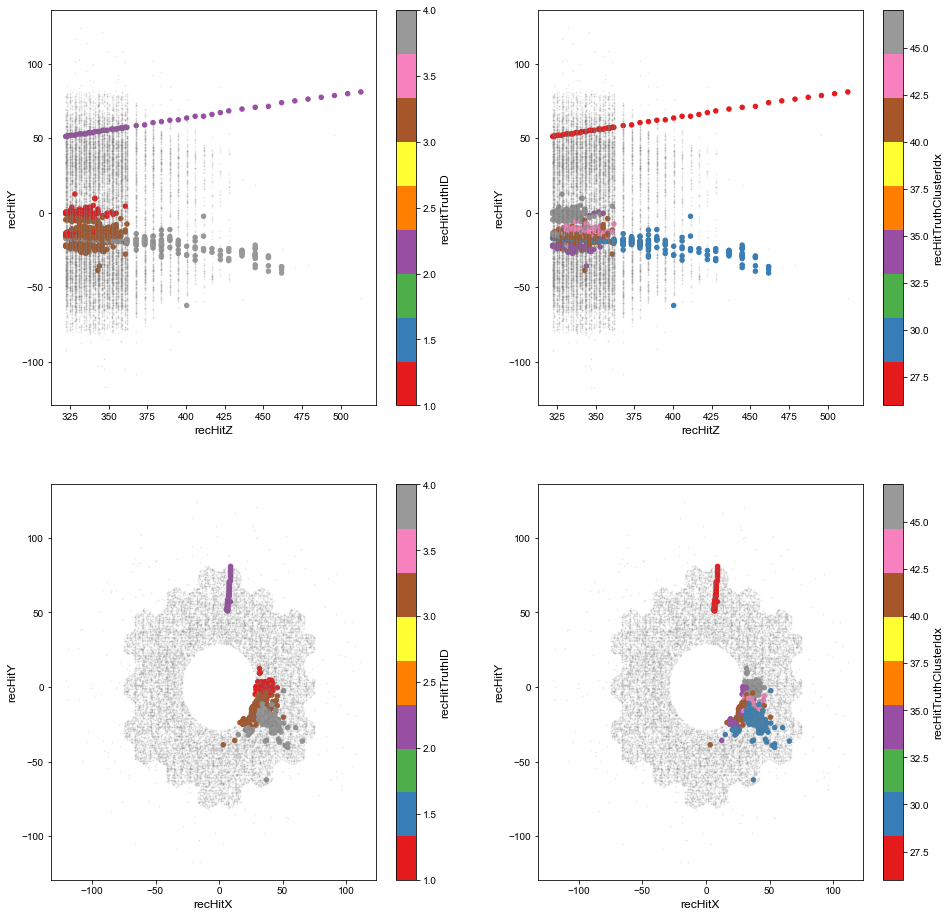

In [5]:
fig, axes = plt.subplots(2, 2, figsize=(16, 16), facecolor='white')

ax = axes[0][0]
df_event_particles.plot('recHitZ', 'recHitY', c='recHitTruthID', cmap='Set1', kind='scatter', ax=ax)
df_event_noise.plot('recHitZ', 'recHitY', c='gray', s=1, kind='scatter', alpha=0.1, ax=ax)

ax = axes[1][0]
df_event_particles.plot('recHitX', 'recHitY', c='recHitTruthID', cmap='Set1', kind='scatter', ax=ax)
df_event_noise.plot('recHitX', 'recHitY', c='gray', s=1, kind='scatter', alpha=0.1, ax=ax)

ax = axes[0][1]
df_event_particles.plot('recHitZ', 'recHitY', c='recHitTruthClusterIdx', cmap='Set1', kind='scatter', ax=ax)
df_event_noise.plot('recHitZ', 'recHitY', c='gray', s=1, kind='scatter', alpha=0.1, ax=ax)

ax = axes[1][1]
df_event_particles.plot('recHitX', 'recHitY', c='recHitTruthClusterIdx', cmap='Set1', kind='scatter', ax=ax)
df_event_noise.plot('recHitX', 'recHitY', c='gray', s=1, kind='scatter', alpha=0.1, ax=ax)

#plt.set_tight_layout()
plt.show()

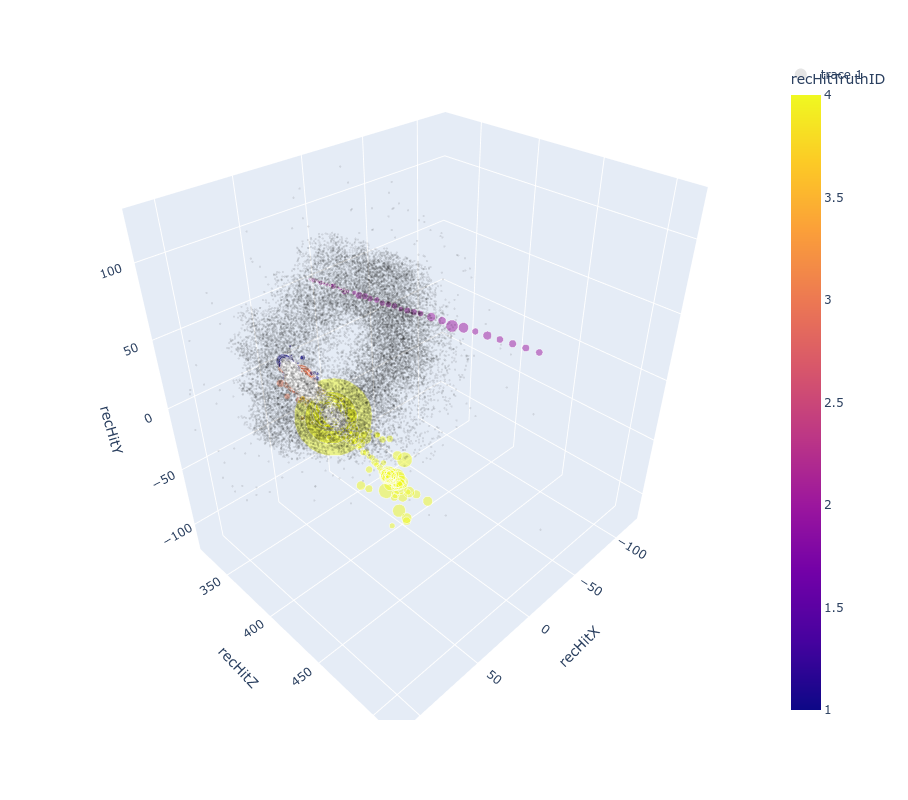

In [6]:
import plotly.express as px
df = px.data.iris()

fig = px.scatter_3d(df_event_particles, 
                    x='recHitX', y='recHitZ', z='recHitY',
                    color='recHitTruthID', 
                    size='recHitEnergy',
                    size_max=100,
                    opacity=0.5,
                    #marker = dict(color='red'),
                    height=800, width=800
                   )
fig.add_scatter3d(x=df_event_noise['recHitX'], y=df_event_noise['recHitZ'], z = df_event_noise['recHitY'], 
                  mode='markers', 
                  opacity=0.1, 
                  marker = dict(color='black', size=1)
                 )

fig.show()

In [15]:
# load gnn model and plot predictions
import torch
from torch_geometric.data import DataLoader

from torch_cmspepr.gravnet_model import GravnetModel
from torch_cmspepr.dataset import TauDataset
import torch_cmspepr.objectcondensation as oc
from scripts.plotting import get_plotly_pred, get_plotly_truth, get_plotly_clusterspace
from scripts.helper_funcs import convert_parallel_model

# load dataset
data_path = 'local_data/npzs_all'
dataset = TauDataset(data_path)
dataset.blacklist([ # Remove a bunch of bad events          
    f'{data_path}/110_nanoML_98.npz',                                          
    f'{data_path}/113_nanoML_13.npz',                                          
    f'{data_path}/124_nanoML_77.npz',                                          
    f'{data_path}/128_nanoML_70.npz',                                          
    f'{data_path}/149_nanoML_90.npz',                                          
    f'{data_path}/153_nanoML_22.npz',                                          
    f'{data_path}/26_nanoML_93.npz',                                           
    f'{data_path}/32_nanoML_45.npz',                                           
    f'{data_path}/5_nanoML_51.npz',                                            
    f'{data_path}/86_nanoML_97.npz',                                           
    ])                                                                      
test_loader = DataLoader(dataset, 
                         batch_size = 1, 
                         shuffle = False
                        )
event_data = next(iter(test_loader))

# get the trained model
device = 'cpu'
state_dict = torch.load('remote_checkpoints/ckpt_best.pth.tar')['model']
state_dict = convert_parallel_model(state_dict)
model = GravnetModel(input_dim=9, output_dim=4).to(device)
model.load_state_dict(state_dict)

with torch.no_grad():
    model.eval()
    result = model(event_data.x, event_data.batch)

    # get clusters
    #result = result.to('cpu')
    betas = torch.sigmoid(result[:,0])
    cluster_coords = result[:, 1:4]
    clusters = oc.get_clustering(betas, cluster_coords, tbeta = 0.1, td = 0.1)
    #clusters_np = get_clustering_np(result[:,0], result[:,1:4])
    
    #fill dataframe
    df_event = pd.DataFrame(event_data.x.numpy(), columns = reco_features) 
    df_event['beta'] = betas.numpy()
    df_event['cluster_id'] = clusters.numpy()
    df_event['recHitTruthClusterIdx'] = event_data.y.numpy()
    df_event[truth_features] = event_data.truth_cluster_props.numpy()
    
df_event.head()

,recHitEnergy,recHitEta,zeroFeature,recHitTheta,recHitR,recHitX,recHitY,recHitZ,recHitTime,beta,cluster_id,recHitTruthClusterIdx,recHitTruthEnergy,recHitTruthX,recHitTruthY,recHitTruthTime,recHitTruthID
0,0.003833,2.743332,0.0,0.128534,324.747131,-41.347862,4.804732,322.068268,-1.0,0.217877,18783,0,0.003833,-41.347862,4.804732,-1.0,0.0
1,0.004714,3.035300,0.0,0.096047,354.415253,-18.362253,-28.601202,352.781769,-1.0,0.176982,18783,0,0.004714,-18.362253,-28.601202,-1.0,0.0
2,0.006061,2.868505,0.0,0.113446,355.064148,-20.442764,-34.607117,352.781769,-1.0,0.171484,18783,0,0.006061,-20.442764,-34.607117,-1.0,0.0
3,0.004714,2.851372,0.0,0.115402,355.143982,-21.136267,-35.007511,352.781769,-1.0,0.170018,18783,0,0.004714,-21.136267,-35.007511,-1.0,0.0
4,0.005387,2.917884,0.0,0.107991,354.848877,-21.829771,-31.403963,352.781769,-1.0,0.173732,18783,0,0.005387,-21.829771,-31.403963,-1.0,0.0


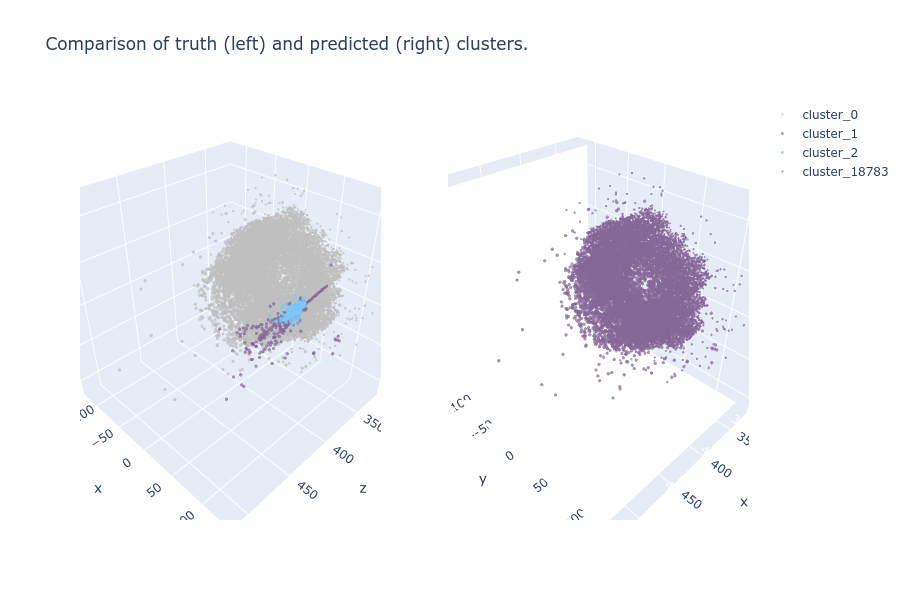

In [16]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

plotly_truth_data = get_plotly_truth(event_data)
plotly_prediction_data = get_plotly_pred(event_data, clusters)

#fig = go.Figure(
#    data=plotly_data,
#    layout=go.Layout(
#        title=go.layout.Title(text='truth cluster for single event'),
#        height=800, width=800
#    )
#)

#fig.show()
scene = dict( xaxis_title='z', yaxis_title='x', zaxis_title='y', aspectmode='cube')

fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]])

for plot in plotly_truth_data:
    fig.add_trace(plot, row=1, col=1)
    
for plot in plotly_prediction_data:
    fig.add_trace(plot, row=1, col=2)

fig.update_layout(
    title_text = 'Comparison of truth (left) and predicted (right) clusters.',
    height = 600,
    width = 1000,
    scene = scene
)

#fig = go.FigureWidget(fig)
#
#def cam_change(layout, camera):
#    fig.layout.scene2.camera = camera
#
#fig.layout.scene1.on_change(cam_change, 'camera')
fig.show()

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 8), facecolor='white')

h, _, _ = ax.hist(betas.numpy(), bins=100)
ax.plot([0.1, 0.1], [0.001, 1e5], 'k:')
ax.set_xlabel('beta')
ax.set_ylabel('counts')
ax.set_yscale('log')
ax.set_ylim(0.1, 5e4)

#plt.set_tight_layout()
plt.show()

In [ ]:
# cluster matching

df_event.groupby(['cluster_id', 'recHitTruthClusterIdx']).sum()['count']